<a href="https://colab.research.google.com/github/pimpisaNga555/DADS7202_Project/blob/main/Object%20Detection/DETR/DADS7202_Project_Transformer_Trained_and_PretrainModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Start Projects

In [2]:
from google.colab import drive
drive.mount('/content/drive')
#df = pd.read_csv("/content/drive/MyDrive/travel_insurance.csv")
#df.head()

Mounted at /content/drive


In [3]:
import sys
print( f"Python {sys.version}\n" )

import numpy as np
print( f"NumPy {np.__version__}\n" )

import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )

# Count the number of GPUs as detected by tensorflow
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )

Python 3.8.16 (default, Dec  7 2022, 01:12:13) 
[GCC 7.5.0]

NumPy 1.21.6

TensorFlow 2.9.2
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


In [4]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Jan  9 09:23:35 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P0    28W /  70W |      3MiB / 15109MiB |      4%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [5]:
import pandas as pd
import os

In [6]:
os.chdir("/content/")
os.getcwd()

'/content'

In [7]:
if "dataset_coco_processing" not in os.listdir() :
    os.mkdir('dataset_coco_processing')

os.chdir("/content/dataset_coco_processing/")
os.getcwd() 

'/content/dataset_coco_processing'

## DETR: DEtection TRansformer training

### Setting folder for running DETR

In [8]:
import os
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.13.0+cu116 True


In [9]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")

In [10]:
if torch.cuda.is_available():
  print('GPU available')
else:
  print('Please set GPU via Edit -> Notebook Settings.')

print(torch.version.cuda) # 10.2

GPU available
11.6


In [11]:
os.chdir("/content/")
os.getcwd()

'/content'

In [12]:
%%capture
import os
print(os.getcwd())

!pip install utils

!git clone https://github.com/facebookresearch/detr

!pip install .

In [13]:
os.chdir("/content/dataset_coco_processing")
os.getcwd()

'/content/dataset_coco_processing'

In [14]:
%%capture
!unzip /content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/car2.v3i.coco.zip

In [15]:
# Rename
os.rename("/content/dataset_coco_processing/train", "/content/dataset_coco_processing/train2017")
os.rename("/content/dataset_coco_processing/train2017/_annotations.coco.json", "/content/dataset_coco_processing/train2017/instances_train2017.json")

os.rename("/content/dataset_coco_processing/test", "/content/dataset_coco_processing/val2017")
os.rename("/content/dataset_coco_processing/val2017/_annotations.coco.json", "/content/dataset_coco_processing/val2017/instances_val2017.json")

In [16]:
import shutil

os.mkdir("annotations")

shutil.move("/content/dataset_coco_processing/train2017/instances_train2017.json", "/content/dataset_coco_processing/annotations/instances_train2017.json")
shutil.move("/content/dataset_coco_processing/val2017/instances_val2017.json", "/content/dataset_coco_processing/annotations/instances_val2017.json")

'/content/dataset_coco_processing/annotations/instances_val2017.json'

In [17]:
os.chdir("/content/detr")
os.getcwd()

'/content/detr'

### Training Version

#### Training Model

In [ ]:
## WARNING!! DON"T RUN BELOW IF YOU DON'T WANT TO TRAIN MODEL

In [ ]:
# training : 1st resume from #"https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" \
!python main.py \
    --lr 0.0001 \
    --batch_size 2 \
    --eos_coef 0.1 \
    --epochs 603  \
    --coco_path "/content/dataset_coco_processing"    \
    --resume "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" \
    --output_dir "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/output_checkpoint"
    #--output_dir "/content/dataset_coco_processing/output" 
    

Streaming output truncated to the last 5000 lines.
Epoch: [210]  [470/779]  eta: 0:01:22  lr: 0.000010  class_error: 0.00  loss: 4.0907 (4.4331)  loss_ce: 0.0548 (0.1060)  loss_bbox: 0.1094 (0.1068)  loss_giou: 0.5217 (0.4900)  loss_ce_0: 0.1345 (0.1550)  loss_bbox_0: 0.1262 (0.1270)  loss_giou_0: 0.4514 (0.5493)  loss_ce_1: 0.1196 (0.1402)  loss_bbox_1: 0.1055 (0.1127)  loss_giou_1: 0.4451 (0.5035)  loss_ce_2: 0.0626 (0.1217)  loss_bbox_2: 0.1159 (0.1105)  loss_giou_2: 0.4397 (0.4906)  loss_ce_3: 0.0713 (0.1107)  loss_bbox_3: 0.1143 (0.1090)  loss_giou_3: 0.4533 (0.4945)  loss_ce_4: 0.0610 (0.1079)  loss_bbox_4: 0.1142 (0.1072)  loss_giou_4: 0.5179 (0.4906)  loss_ce_unscaled: 0.0548 (0.1060)  class_error_unscaled: 0.0000 (7.0048)  loss_bbox_unscaled: 0.0219 (0.0214)  loss_giou_unscaled: 0.2608 (0.2450)  cardinality_error_unscaled: 1.0000 (2.5839)  loss_ce_0_unscaled: 0.1345 (0.1550)  loss_bbox_0_unscaled: 0.0252 (0.0254)  loss_giou_0_unscaled: 0.2257 (0.2746)  cardinality_error_0_unsc

#### Eval: Original Image (No Patch)

In [ ]:
os.chdir("/content/")

if "dataset_coco_test_patch" not in os.listdir("/content/"):
    os.mkdir("/content/dataset_coco_test_patch")

os.chdir("/content/dataset_coco_test_patch")

!unzip /content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/car2.v5i.coco.zip

os.rename("/content/dataset_coco_test_patch/train", "/content/dataset_coco_test_patch/train2017")
os.rename("/content/dataset_coco_test_patch/train2017/_annotations.coco.json", "/content/dataset_coco_test_patch/train2017/instances_train2017.json")

os.rename("/content/dataset_coco_test_patch/test", "/content/dataset_coco_test_patch/val2017")
os.rename("/content/dataset_coco_test_patch/val2017/_annotations.coco.json", "/content/dataset_coco_test_patch/val2017/instances_val2017.json")

os.mkdir("/content/dataset_coco_test_patch/annotations")

shutil.move("/content/dataset_coco_test_patch/train2017/instances_train2017.json", "/content/dataset_coco_test_patch/annotations/instances_train2017.json")
shutil.move("/content/dataset_coco_test_patch/val2017/instances_val2017.json", "/content/dataset_coco_test_patch/annotations/instances_val2017.json")


Archive:  /content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/car2.v5i.coco.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/COCO_val2014_000000000328_jpg.rf.9b70ce3f5811f3c5c78d21518a800837.jpg  
 extracting: test/COCO_val2014_000000000359_jpg.rf.5aac8538a1f4f45d358b7acf2f6a8981.jpg  
 extracting: test/COCO_val2014_000000008333_jpg.rf.68730290225dffda25ba226ba2157f2c.jpg  
 extracting: test/COCO_val2014_000000008498_jpg.rf.67a0bca761a28bb97e449ff002dcec4e.jpg  
 extracting: test/COCO_val2014_000000008646_jpg.rf.05e9137eaac8f462a9d971a667a53039.jpg  
 extracting: test/COCO_val2014_000000016599_jpg.rf.83b531ad5123f9c8a9359d9112ade6f6.jpg  
 extracting: test/COCO_val2014_000000016838_jpg.rf.7f359f4676aa9dc2964a64baaf696fe2.jpg  
 extracting: test/COCO_val2014_000000024629_jpg.rf.c75cbac242d570958a98cd39bb34068f.jpg  
 extracting: test/COCO_val2014_000000024693_jpg.rf.901d8916db45b7fb3ff4fbc7967e607c.jpg  
 extract

'/content/dataset_coco_test_patch/annotations/instances_val2017.json'

In [ ]:
# list id img val2017
list_val2017 = []

for val_im in os.listdir("/content/dataset_coco_processing/val2017"):
    list_val2017.append(val_im)
print(len(list_val2017))

290


In [ ]:
img_list_lost = ["COCO_val2014_000000303321_jpg.rf.77df4047ea7e9257e9cd630b52842cf5.jpg",
"COCO_val2014_000000507975_jpg.rf.0a826084e2c06038e19da0e8e028f83a.jpg",
"COCO_val2014_000000516422_jpg.rf.e7b04ee47c95e469cd8c60a17ad7d212.jpg"]
print(len(img_list_lost))

3


In [ ]:
# eval for test data patch in a car
# Original image
!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
def del_val2017(val2017= "/content/dataset_coco_test_patch/val2017/"):
    for i in os.listdir(val2017) :
        os.remove(f"{val2017}{i}")
# for i in os.listdir('/content/dataset_coco_test_patch/val2017') :
#     os.remove(f"/content/dataset_coco_test_patch/val2017/{i}")

def copyfile_val2017(locat, val2017, pic_lost):
    for i in os.listdir(locat) :
        if i[-4:] == ".jpg" :
            shutil.copyfile(f"{locat}{i}", f"{val2017}{i}")
    for j in img_list_lost :
        shutil.copyfile(f"{pic_lost}{j}", f"{val2017}{j}")

# for i in os.listdir(locat) :
#     if i[-4:] == ".jpg" :
#         shutil.copyfile(f"{locat}/{i}", f"/content/dataset_coco_test_patch/val2017/{i}")

my_val2017 = "/content/dataset_coco_test_patch/val2017/"
img_lost = "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/"

#### Eval: 1.Position

In [ ]:
# Add_patch2_40%_left_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Left/5_left" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_left_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Left/10_left" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_left_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Left/15_left" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_right_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Right/5_right" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_right_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Right/10_right" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_right_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Right/15_right" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_up_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Up_/5_up" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_up_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Up_/10_up" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_up_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Up_/15_up" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_down_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Down/5_down" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_down_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Down/10_down" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_down_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Down/15_down" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_upleft_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Upleft_/5_upleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_upleft_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Upleft_/10_upleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_upleft_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Upleft_/15_upleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_upright_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/UpRight_/5_upright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_upright_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/UpRight_/10_upright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_upright_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/UpRight_/15_upright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_downleft_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/DownLeft/5_downleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_downleft_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/DownLeft/10_downleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_downleft_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/DownLeft/15_downleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_downright_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Downright/5_downright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_downright_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Downright/10_downright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_patch2_40%_downright_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Downright/15_downright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

#### Eval: 2.Shape Patch

In [ ]:
# Add_Center_Quadangle
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Center" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_CirclePatch
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Circle_patch" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

In [ ]:
# Add_Spatch_center
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/S_patch" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth" #https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_ut

### Pre-trained Version

#### Eval: Original Image (No Patch)

In [ ]:
# eval for test data patch in a car
# Original image
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth"
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
def del_val2017(val2017= "/content/dataset_coco_test_patch/val2017/"):
    for i in os.listdir(val2017) :
        os.remove(f"{val2017}{i}")
# for i in os.listdir('/content/dataset_coco_test_patch/val2017') :
#     os.remove(f"/content/dataset_coco_test_patch/val2017/{i}")

def copyfile_val2017(locat, val2017, pic_lost):
    for i in os.listdir(locat) :
        if i[-4:] == ".jpg" :
            shutil.copyfile(f"{locat}{i}", f"{val2017}{i}")
    for j in img_list_lost :
        shutil.copyfile(f"{pic_lost}{j}", f"{val2017}{j}")

# for i in os.listdir(locat) :
#     if i[-4:] == ".jpg" :
#         shutil.copyfile(f"{locat}/{i}", f"/content/dataset_coco_test_patch/val2017/{i}")

my_val2017 = "/content/dataset_coco_test_patch/val2017/"
img_lost = "/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/"

#### Eval: 1.Position

In [ ]:
# Add_patch2_40%_left_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Left/5_left" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth"
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_left_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Left/10_left" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_left_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Left/15_left" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_right_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Right/5_right" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_right_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Right/10_right" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_right_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Right/15_right" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_up_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Up_/5_up" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_up_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Up_/10_up" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_up_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Up_/15_up" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_down_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Down/5_down" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_down_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Down/10_down" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_down_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Down/15_down" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_upleft_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Upleft_/5_upleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_upleft_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Upleft_/10_upleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_upleft_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Upleft_/15_upleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_upright_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/UpRight_/5_upright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_upright_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/UpRight_/10_upright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_upright_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/UpRight_/15_upright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_downleft_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/DownLeft/5_downleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_downleft_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/DownLeft/10_downleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_downleft_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/DownLeft/15_downleft" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_downright_5%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Downright/5_downright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_downright_10%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Downright/10_downright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_patch2_40%_downright_15%
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Downright/15_downright" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

#### Eval: 2.Shape Patch

In [ ]:
# Add_Center_Quadangle
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Center" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_CirclePatch
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Circle_patch" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

In [ ]:
# Add_Spatch_center
# delete id img val2017
del_val2017(my_val2017)

# copyfile to val2017
this_locat = "/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/S_patch" + "/"
copyfile_val2017(this_locat, my_val2017, img_lost)

# eval for test data patch in a car
os.chdir("/content/detr")

!python main.py \
    --batch_size 2 \
    --coco_path "/content/dataset_coco_test_patch" \
    --no_aux_loss \
    --eval \
    --resume  "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" 
    

Not using distributed mode
git:
  sha: 8a144f83a287f4d3fece4acdf073f387c5af387d, status: clean, branch: main

Namespace(aux_loss=False, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dataset_coco_test_patch', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=True, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarn

## Example predicted patch in an image

### Checking logs

In [ ]:
from util.plot_utils import plot_logs
from pathlib import Path

fields = ('loss', 'loss_ce','loss_bbox','loss_giou','class_error' ,'mAP') 
laprop83 = Path.cwd()/'/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data'   #'/content/dataset_coco_processing/output'

plot_utils.py::plot_logs info: logs param expects a list argument, converted to list[Path].


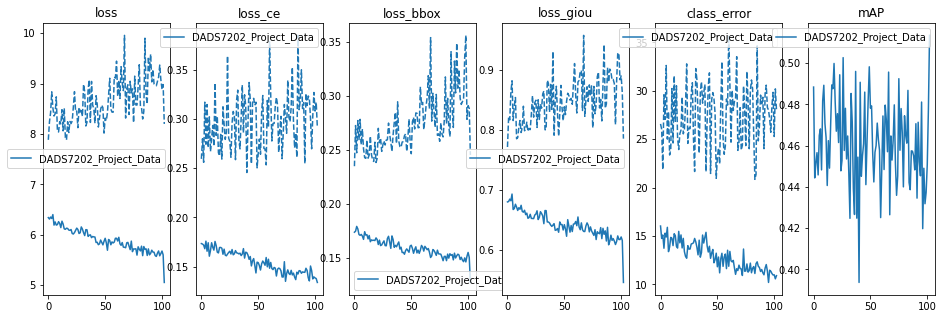

In [ ]:
# eos_coef == 0.01, epochs==199
plot_logs(laprop83, fields)

### Load Model

In [19]:
# https://github.com/facebookresearch/detr/blob/main/hubconf.py
import torch

from models.backbone import Backbone, Joiner
from models.detr import DETR, PostProcess, SetCriterion
from models.position_encoding import PositionEmbeddingSine
from models.segmentation import DETRsegm, PostProcessPanoptic
from models.transformer import Transformer

dependencies = ["torch", "torchvision"]

def _make_detr(backbone_name: str, dilation=False, num_classes=91, mask=False):
    hidden_dim = 256
    backbone = Backbone(backbone_name, train_backbone=True, return_interm_layers=mask, dilation=dilation)
    pos_enc = PositionEmbeddingSine(hidden_dim // 2, normalize=True)
    backbone_with_pos_enc = Joiner(backbone, pos_enc)
    backbone_with_pos_enc.num_channels = backbone.num_channels
    transformer = Transformer(d_model=hidden_dim, return_intermediate_dec=True)
    detr = DETR(backbone_with_pos_enc, transformer, num_classes=num_classes, num_queries=100)
    if mask:
        return DETRsegm(detr)
    return detr

def detr_resnet50(pretrained=False, num_classes=91, return_postprocessor=False):
    """
    DETR R50 with 6 encoder and 6 decoder layers.
    Achieves 42/62.4 AP/AP50 on COCO val5k.
    """
    model = _make_detr("resnet50", dilation=False, num_classes=num_classes)
    if pretrained:
        checkpoint = torch.hub.load_state_dict_from_url(
            url="https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth", map_location="cpu", check_hash=True
        )
        model.load_state_dict(checkpoint["model"]) #, strict=False
    if return_postprocessor:
        return model, PostProcess()
    return model

In [20]:
# create temp model
model_detr_resnet50 = detr_resnet50().to(device) #1558+1  num_classes=1

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [21]:
# load checkpoint to model
checkpoint_detr = torch.load("/content/drive/MyDrive/NIDA/DADS7202/DADS7202_Project_Data/checkpoint0199.pth")
model_detr_resnet50.load_state_dict(checkpoint_detr['model'], strict=False)

<All keys matched successfully>

In [ ]:
model_detr_resnet50.class_embed

Linear(in_features=256, out_features=92, bias=True)

In [22]:
import torchvision.transforms as T

num_resize = 416

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(num_resize),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * (torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32).cuda())
    return b

In [23]:
def filter_bboxes_from_outputs(outputs,
                               threshold=0.7):
  
  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  
  return probas_to_keep, bboxes_scaled

def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

def run_worflow(my_image, my_model, lst_threshold=[0.9, 0.7, 0.5, 0.3, 0.1]):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0).cuda()

  # propagate through the model
  outputs = my_model(img)

  for threshold in lst_threshold:
    print(threshold)
    
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)

    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)

0.075


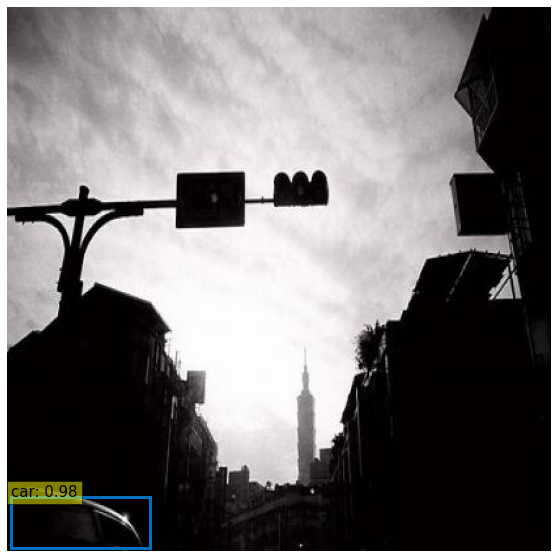

0.1


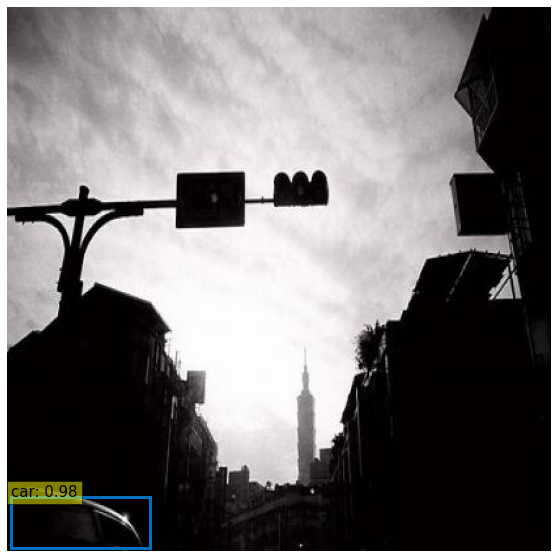

0.3


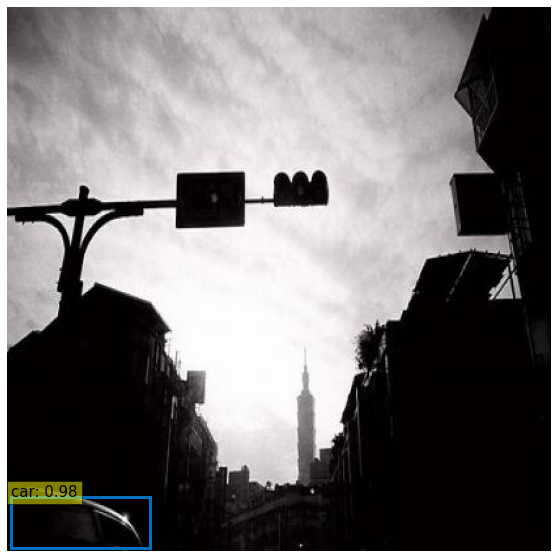

0.5


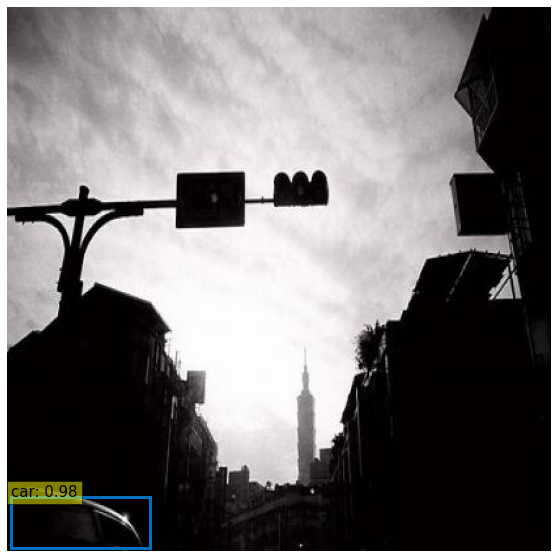

0.9


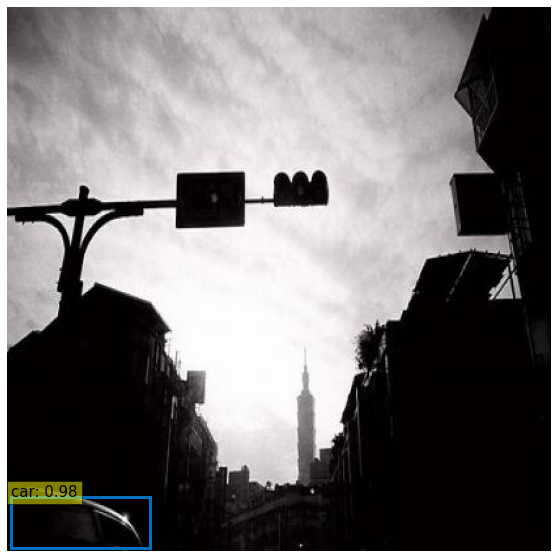

In [41]:
# Without Patch

from PIL import Image

num_classes = 2
finetuned_classes = ['N/A', 'car']
COLORS = [[0.000, 0.447, 0.741], [0.301, 0.745, 0.933]] # [0.850, 0.325, 0.098], [0.929, 0.694, 0.125], [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], 
img_name = '/content/dataset_coco_processing/val2017/COCO_val2014_000000000359_jpg.rf.1d23580f88e04012e220af72dcf1a3ca.jpg'

im = Image.open(img_name)

lst_thresholds = [0.075, 0.1, 0.3, 0.5, 0.9]

run_worflow(im, model_detr_resnet50, lst_threshold=lst_thresholds)

0.075


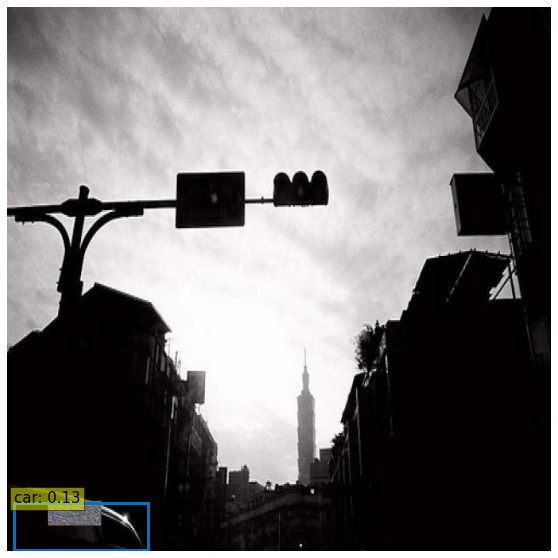

0.1


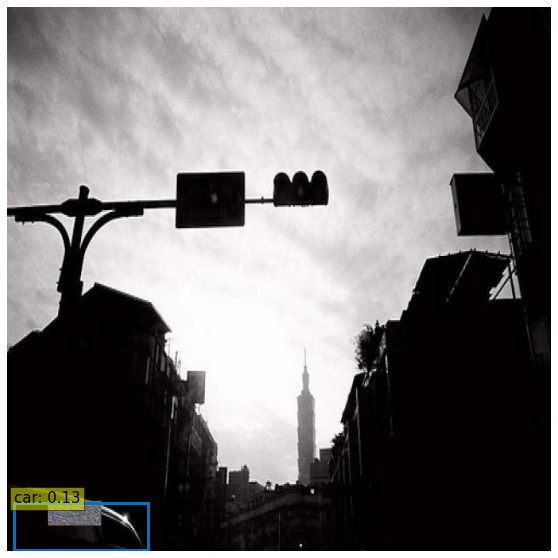

0.3


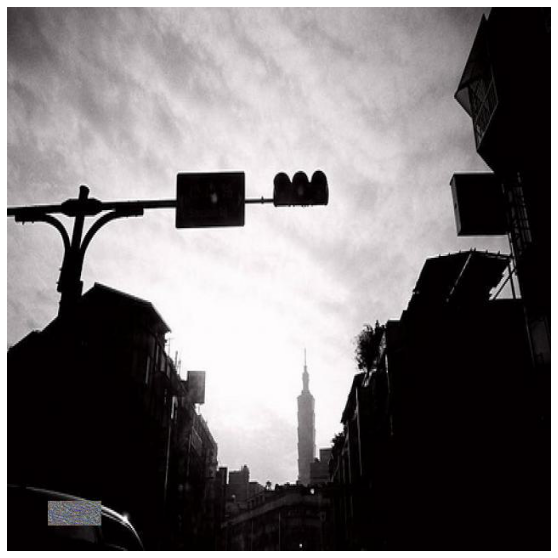

0.5


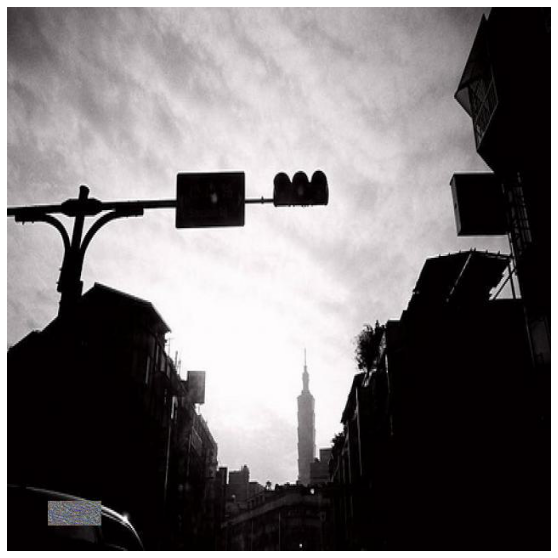

0.9


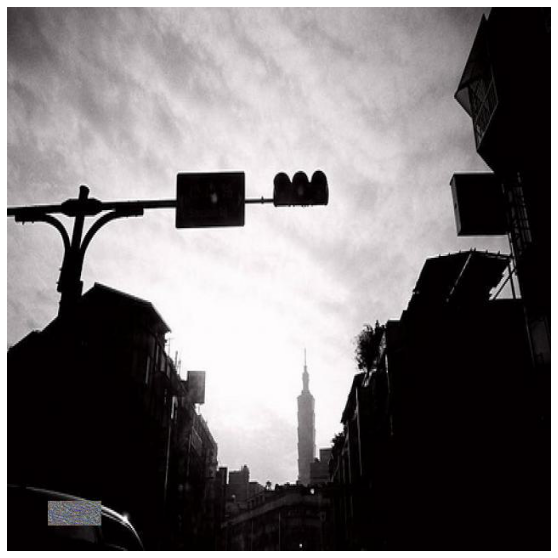

In [42]:
# With Patch
from PIL import Image

num_classes = 2
finetuned_classes = ['N/A', 'car']
COLORS = [[0.000, 0.447, 0.741], [0.301, 0.745, 0.933]] # [0.850, 0.325, 0.098], [0.929, 0.694, 0.125], [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], 
img_name = '/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Center/COCO_val2014_000000147576_jpg.rf.d18ea11d655d2699535404c2aca09833.jpg'
img_name = '/content/drive/MyDrive/DADS7202_Project2/AddPatch_All/Center/COCO_val2014_000000000359_jpg.rf.5aac8538a1f4f45d358b7acf2f6a8981.jpg'

im = Image.open(img_name)

lst_thresholds = [0.075, 0.1, 0.3, 0.5, 0.9]

run_worflow(im, model_detr_resnet50, lst_threshold=lst_thresholds)